In [ ]:
%load_ext autoreload
%autoreload 2

import json
import os
import pickle
from collections import defaultdict
from glob import glob
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import rcParams
from matplotlib.lines import Line2D

from plot_utils import * 

params = {
    'font.size': 18,
    'legend.fontsize': 18,
    'text.usetex': False,
}
rcParams.update(params)

## Distribution learning results

In [ ]:
results = defaultdict(list)
for fn in glob('results/addcarbon/**/guacamol_results.json'):
    with open(fn, 'r') as f:
        r = json.load(f)['results']
        for bm in r:
            results[bm['benchmark_name']].append(bm['score'])

for k, l in results.items():
    print(f"{k}:\t{np.mean(l):.4f} +- {np.std(l):.4f}")

Validity:	1.0000 +- 0.0000
Uniqueness:	0.9994 +- 0.0004
Novelty:	1.0000 +- 0.0000
KL divergence:	0.9827 +- 0.0016
Frechet ChemNet Distance:	0.8664 +- 0.0024


In [ ]:
# Set up some settings of where to read from and if/where to save figures.
# If write is set to False no plots will be saved which is useful for testing
results_dir = Path('results/goal_directed_paper/')
figure_dir = Path('figures')
os.makedirs(figure_dir, exist_ok=True)
write = False

## Table 2

In [ ]:
columns = ['AssayID', 'TargetName', 'TargetID']
rows = [('CHEMBL3888429', 'JAK2', 'CHEMBL2971'),
        ('CHEMBL1909203', 'EGFR', 'CHEMBL203'),
        ('CHEMBL1909140', 'DRD2', 'CHEMBL217'),
        ('CHEMBL1794345', 'Pla. Fal.', 'CHEMBL364'),
        ('CHEMBL1741322', 'Cytochrome', 'CHEMBL3356'),
        ('CHEMBL1963961', 'CCRF-CEM', 'CHEMBL382')]
assay_info = pd.DataFrame(rows, columns=columns)
# display(assay_info)

# dictionary to convert chemblID to readable name
chid2name = dict(zip(assay_info['AssayID'], assay_info['TargetName']))

# The predictions for OS, MCS and DCS are saved in dictionaries with these keys
# These dictionaries map these identifiers to more readable strings, colors/linestyles used in plots
order = ('Split1', 'Split1_alt', 'Split2')
legend_dict = dict(zip(order, ['Optimization score', 'Model control score', 'Data control score']))
col_dict = dict(zip(order, ['blue', 'green', 'red']))
col_dict2 = dict(zip(order, ['cyan', 'magenta', 'green']))
ls_dict = dict(zip(order, ['-', '--', '-.']))

# get chembl identifiers used in experiments
# go one step down in tree to get the name of some optimizer ('graph_ga' or 'lstm_hc')
chids = os.listdir(results_dir/'graph_ga')
print(chids)
# get some stats on these assays
assay_stats = []
for chid in chids:
    row = {}
    assay_data = pd.read_csv(f'./assays/processed/{chid}.csv')
    label = assay_data['label']
    
    row['active'] = label.sum()
    row['inactive'] = len(label) - row['active']
    row['size'] = len(label)
    row['AssayID'] = chid
    assay_stats.append(row)

assay_stats = pd.DataFrame(assay_stats)

# get mean and std of all the classifiers trained for dataset
aucs = defaultdict(list)
optimizers = [o.name for o in results_dir.iterdir() if o.is_dir()]
for optimizer in optimizers:
    for i, chid in enumerate(chids):
        print(chid)
        print(results_dir)
        print(optimizer)
        _, _, auc, _, _ = load_chid(results_dir/optimizer/chid, order)
        aucs[chid] += [v for x in auc.values() for v in x]
        
aucs = {k: (np.mean(v), np.std(v)) for k, v in aucs.items()}

auc_df = pd.DataFrame(aucs).transpose()
auc_df.columns = ['AUC_mean', 'AUC_std']
auc_df['AssayID'] = auc_df.index
auc_df.index = np.arange(len(auc_df))

assay_stats = assay_stats.merge(auc_df, on='AssayID')
assay_stats['AUC'] = [f"{auc:.2f}$\pm${std:.3f}" for auc, std in zip(assay_stats['AUC_mean'], assay_stats['AUC_std'])]
display(assay_stats)

# Create latex table. The target name has to be supplied manually above.
# Otherwise it is left empty
table = assay_info.merge(assay_stats, on='AssayID', how='right')
columns=['TargetName', 'AssayID', 'active', 'inactive', 'AUC']
names = ['Target', 'ChEMBL ID', 'Active', 'Inactive', 'AUC']
table = table[columns]
table.columns = names
lt = table.to_latex(float_format="%.5f", escape=False, index=False)
print(lt)

['CHEMBL1909140', 'CHEMBL3888429', 'CHEMBL1909203']
CHEMBL1909140
results/goal_directed_paper
lstm_hc
CHEMBL3888429
results/goal_directed_paper
lstm_hc
CHEMBL1909203
results/goal_directed_paper
lstm_hc
CHEMBL1909140
results/goal_directed_paper
graph_ga
CHEMBL3888429
results/goal_directed_paper
graph_ga
CHEMBL1909203
results/goal_directed_paper
graph_ga


,active,inactive,size,AssayID,AUC_mean,AUC_std,AUC
0,59,783,842,CHEMBL1909140,0.858855,0.025844,0.86$\pm$0.026
1,140,527,667,CHEMBL3888429,0.782164,0.018090,0.78$\pm$0.018
2,40,802,842,CHEMBL1909203,0.751573,0.052386,0.75$\pm$0.052


\begin{tabular}{llrrl}
\toprule
Target &      ChEMBL ID &  Active &  Inactive &             AUC \\
\midrule
  JAK2 &  CHEMBL3888429 &     140 &       527 &  0.78$\pm$0.018 \\
  EGFR &  CHEMBL1909203 &      40 &       802 &  0.75$\pm$0.052 \\
  DRD2 &  CHEMBL1909140 &      59 &       783 &  0.86$\pm$0.026 \\
\bottomrule
\end{tabular}



## Figure 3: Median scores for both optimizers

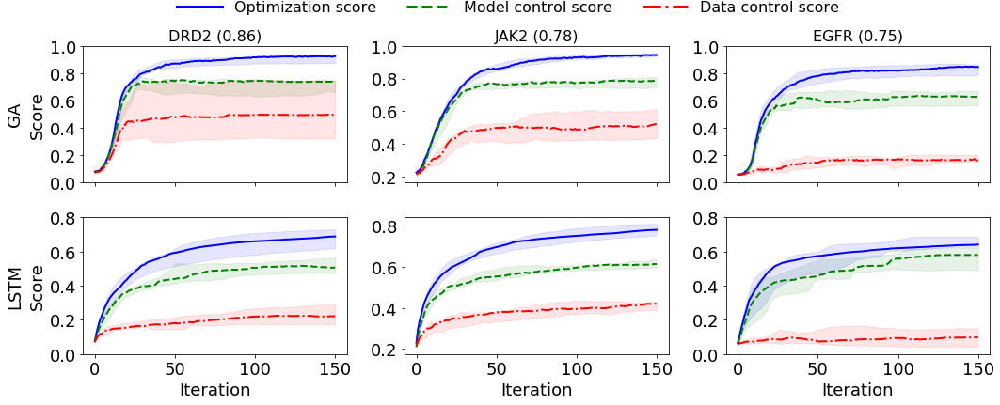

In [ ]:
auc_title = True # whether or not to include auc in plot
lw = 2 # line width
nrows = 2 # for two optimizers
ncols = len(chids) # for the number of tasks


fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 6), sharex=True)
for r_idx, optimizer in enumerate(optimizers):
    for c_idx, chid in enumerate(chids):
        ax = axes[r_idx][c_idx]
        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', col_dict=col_dict, legend_dict=legend_dict, ls_dict=ls_dict, ax=ax, legend=False, lw=lw)
        
        # makes ticks a bit prettier and always makes them at multiples of 0.2
        low, high = ax.set_ylim()
        yticks = np.arange(round(low/0.2) * 0.2, round(high/0.2) * 0.2 +0.01, 0.2)
        ax.set_yticks(yticks)

# set axes labels 
for i in range(nrows):
    axes[i][0].set_ylabel('Score')
    
for i in range(ncols):
    axes[-1][i].set_xlabel('Iteration')

# set titles to denote tasks
for i, chid in enumerate(chids):
    title = chid2name.get(chid, chid)
    if auc_title:
        title += f' ({aucs[chid][0]:.2f})'
    axes[0][i].set_title(title, fontsize=16)

# create legend
custom_lines = [Line2D([0], [0], color=col_dict[k], lw=3, ls=ls_dict[k]) for k in col_dict.keys()]
fig.legend(custom_lines, list(legend_dict.values()), loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.03), frameon=False, fontsize=16,handlelength=3)

# add optimizer info by adding text
xtext = -55
axes[0][0].text(xtext, sum(axes[0][0].get_ylim()) /2 , "GA", rotation=90, verticalalignment='center')
axes[1][0].text(xtext, sum(axes[1][0].get_ylim()) /2, "LSTM", rotation=90, verticalalignment='center')
fig.tight_layout()

if write:
    plt.savefig(f'{figure_dir}/median_scores.pdf')

# Figure 2: Scatter plot series
Scatter plots. To create the contours plot the corresponding script (TODO: add name)

In [ ]:
# This file is created by running the `predictions.py` script
with open(results_dir/'predictions.p', 'rb') as f:
    trainset_predictions = pickle.load(f)

results/goal_directed_paper/graph_ga/CHEMBL1909140


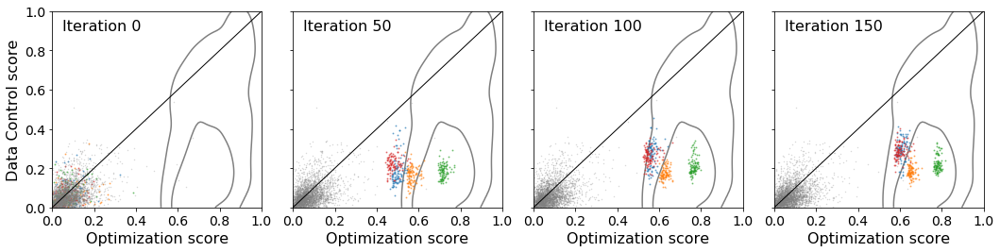

results/goal_directed_paper/lstm_hc/CHEMBL1909140


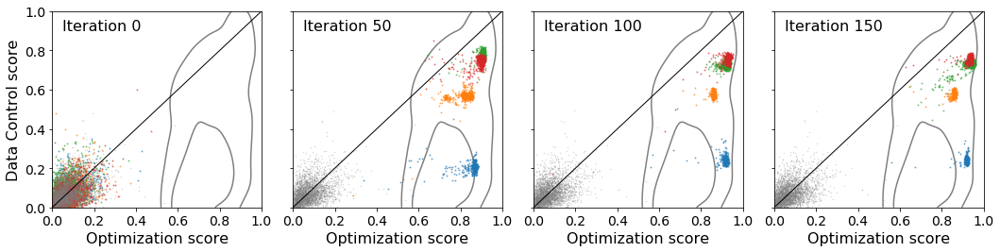

results/goal_directed_paper/graph_ga/CHEMBL3888429


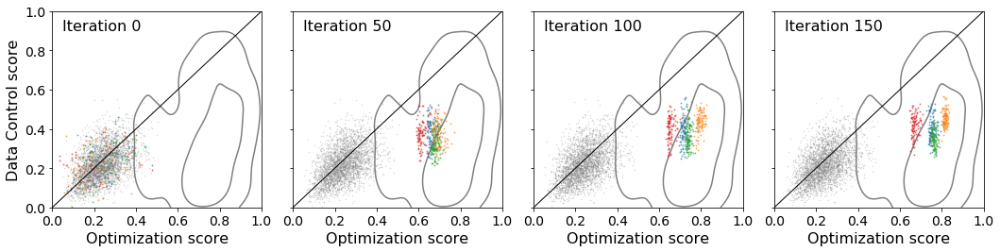

results/goal_directed_paper/lstm_hc/CHEMBL3888429


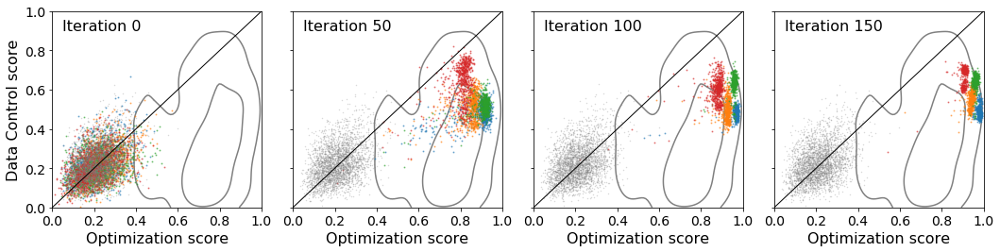

results/goal_directed_paper/graph_ga/CHEMBL1909203


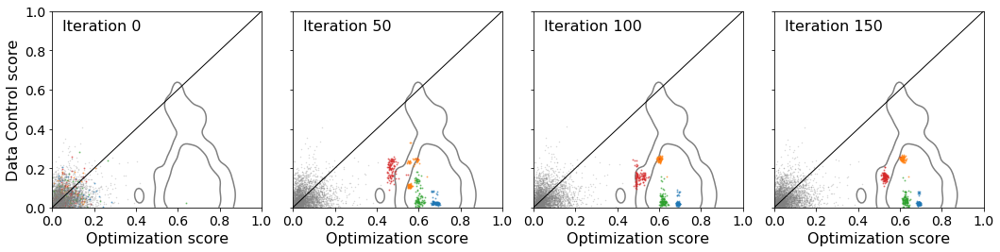

results/goal_directed_paper/lstm_hc/CHEMBL1909203


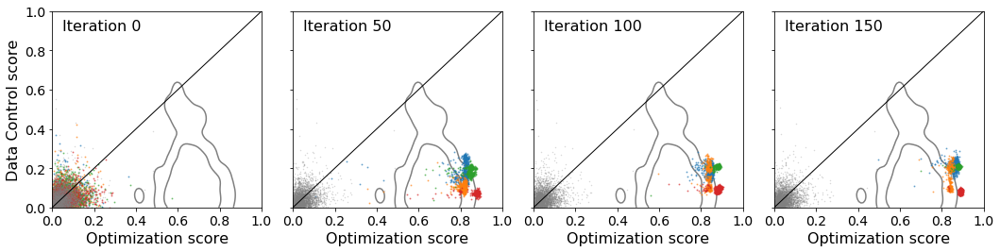

results/goal_directed_paper/graph_ga/CHEMBL1909140


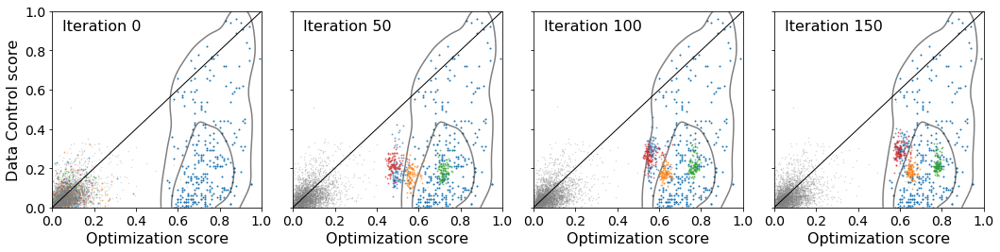

results/goal_directed_paper/lstm_hc/CHEMBL1909140


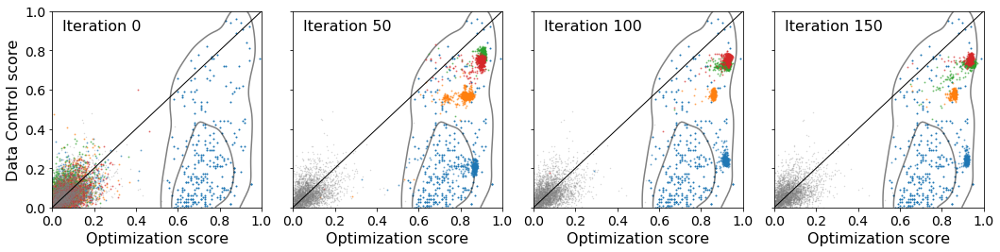

results/goal_directed_paper/graph_ga/CHEMBL3888429


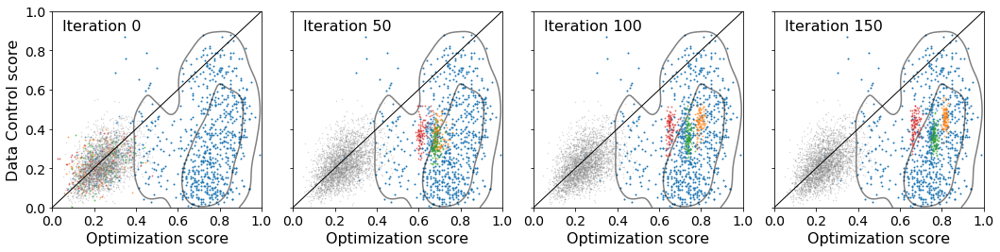

results/goal_directed_paper/lstm_hc/CHEMBL3888429


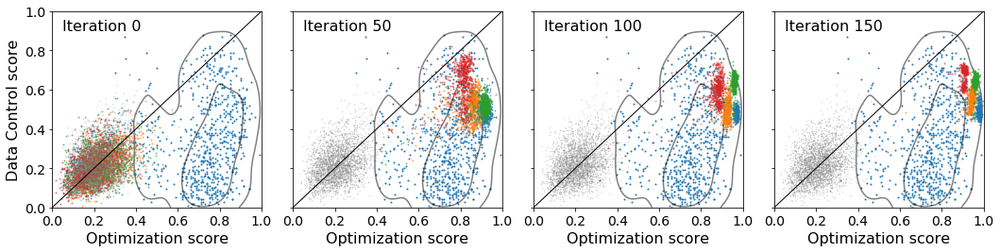

results/goal_directed_paper/graph_ga/CHEMBL1909203


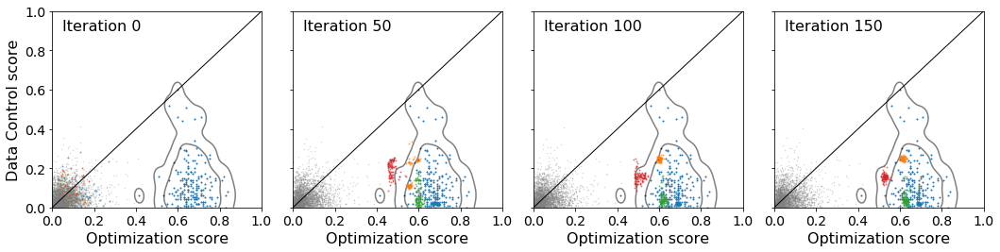

results/goal_directed_paper/lstm_hc/CHEMBL1909203


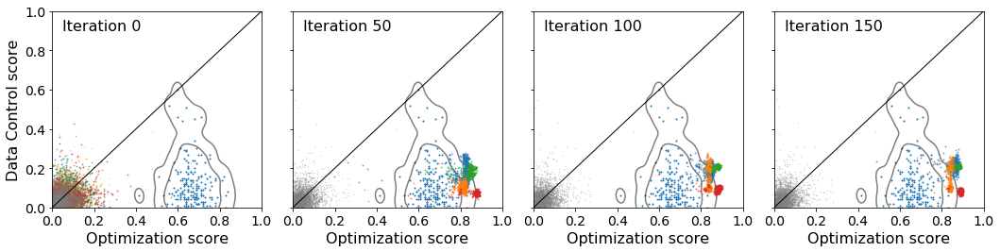

In [ ]:
import seaborn as sns
import scipy.stats as st

name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 4 # one column for four different iterations
n_runs = 4 # how many runs to use. Using all runs the plots get quite cluttered

params = {
    'axes.labelsize': 16,
    'font.size': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

# `scatter` controls whether or not to plot OS / DCS on 
for scatter in [False, True]:
    for chid in chids:
        for optimizer in ['graph_ga', 'lstm_hc']:
            chid_dir = results_dir/optimizer/chid
            print(chid_dir)
            
            # get predictions for optimized molecules
            preds_internal, preds_external, auc, _, _ = load_chid(results_dir/optimizer/chid, order)
            split1 = preds_internal['Split1']
            split2 = preds_internal['Split2']
            
            # get even spaced intervals in iterations
            n_iterations = len(split1[0]) - 1
            plot_iters = np.linspace(0, n_iterations, ncols).astype('int32')
            
            fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 4), sharey=True)
            for i, iteration in enumerate(plot_iters):   # loop over iterations
                ax = axes[i]

                # get predictions on trainset
                p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]
                
                # plot contours. If scatter is true OS/DCS on trainset actives will be plotted.
                countour(p11s, p21s, y1s, ax, levels=[0.5, 3], scatter=scatter)
                
                # plot optimized molecules
                for run in range(n_runs):
                    a1 = jitter(split1[run][iteration], scale=scale)
                    a2 = jitter(split2[run][iteration], scale=scale)
                    ax.plot(a1,a2,'o',rasterized=True, markersize=1, alpha=0.5)
                    
                # plot random molecules from chembl
                e1 = jitter(preds_external['Split1'][0], scale=scale)
                e2 = jitter(preds_external['Split2'][0], scale=scale)
                ax.plot(e1,e2, 'o', rasterized=True, markersize=0.5, alpha=0.3, c='grey')
                
                # add diagonal
                ax.plot([0,1],[0,1], lw=1, c='black')
                
                # plot appearance and label
                ax.set_xlim((0,1))
                ax.set_ylim((0,1))
                ax.set_xticks(np.linspace(0,1,6))
                ax.set_yticks(np.linspace(0,1,6))
                ax.set_xlabel('Optimization score')
                ax.text(0.05,.9, f"Iteration {iteration}")
                
            axes[0].set_ylabel('Data Control score')
            plt.tight_layout()
            plt.subplots_adjust(wspace = 0.15)
            if write:
                add = 'trainscatter_' if scatter else ''
                plt.savefig(f'{figure_dir}/scatter/{add}{optimizer}_{chid2name[chid]}.pdf', dpi=300)
            plt.show()

# Visualize the molecules

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
from IPython.display import display, SVG, HTML

# read "real" molecules and optimized molecules
assay_root = Path('assays/processed/')
smiles_dict = defaultdict(dict)
for chid in chids:
    print(chid2name[chid])
    name = chid2name[chid]
    
    file = f"{assay_root/chid}.csv"
    df = pd.read_csv(file)
        
    # set random seed for reproducibility of compound choice
    for optimizer in ['graph_ga', 'lstm_hc']:
        
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, aucs, all_smiles, _ = load_chid(results_dir/optimizer/chid, order)
        
        smiles_dict[name][optimizer] = [s for run in all_smiles for s in run[-1]]
        
    smiles_dict[name]['real'] = df[df.label==1].smiles

DRD2
JAK2
EGFR


RDKit WARNING: [10:49:41] Enabling RDKit 2019.09.1 jupyter extensions


## Draws molecules into a constant sized images
I scale up the font size for large molecules to make the fonts readable for large molecules

In [ ]:
import cairosvg
import rdkit
from rdkit import Chem, Geometry
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole, rdMolDraw2D
import cairosvg

def get_dist(m):
    AllChem.Compute2DCoords(m)

    coords = m.GetConformer(-1).GetPositions()
    min_x, min_y = coords.min(0)[:2]
    max_x, max_y = coords.max(0)[:2]
    
    x_dist = max_x - min_x + 0.5
    y_dist = max_y - min_y + 0.5
    return x_dist, y_dist

# print(get_dist(Chem.MolFromSmiles('CC')))

def draw_constant_size(m, x_size=500, y_size=300):
    """When plotting a large molecule in a constant sized image the atom labels get really small.
    This is because the atom labels are scaled with the bond lengths (physical size).
    This can be solved by scaling up the font size the same amount the bond length is shortened
    This breaks when molecules get too large though as the atom labels will dominate the plots.
    """
    # get width / height in Angstrom (?)
    x_dist, y_dist = get_dist(m)
    
    # get dots per angstrom
    x_dpa = x_size / x_dist
    y_dpa = y_size / y_dist
    
    """
    if dpa are low in one dimension the bond length in dots will be low
    This means that font size will appear low in final plot.
    Therefore scale up font size with the minimum of the two values.
    """
    scale = min(x_dpa, y_dpa)
    fs = 14 / scale
    
    # the above doesn't work if the molecules are very small. The font size will become too small
    # Therefore correct this. The value of 0.4 is chosen to get a similar font size for all 
    # molecule sizes. I tested this empirically.
    fs = max(fs, 0.4)
    AllChem.Compute2DCoords(m)
    d = rdMolDraw2D.MolDraw2DSVG(x_size, y_size) # or MolDraw2DCairo to get PNGs
    d.SetFontSize(fs)
    d.DrawMolecule(m)

    d.FinishDrawing()
    return d


plot_dir = Path(f'{figure_dir}/molplots')
print(plot_dir)
os.makedirs(plot_dir, exist_ok=True)
os.makedirs(plot_dir/'svg', exist_ok=True)
os.makedirs(plot_dir/'pdf', exist_ok=True)

np.random.seed(42)
x_size, y_size = 500, 300
mols_per_cat = 6
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            m = Chem.MolFromSmiles(s)
            
            d = draw_constant_size(m)
            img = d.GetDrawingText()
            imgs.append(img)
            
            if write:
                fn = '_'.join([name, cat, str(i)])+'.svg'
                svgfile = plot_dir/'svg'/fn
                with open(svgfile, 'w') as f:
                    f.write(img)
                cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

figures/molplots


# Additional plots not in the paper

## This draws molecules with a constant bond length.

In [ ]:
import cairosvg

def draw_scale(m, dpa=20, fs=0.7):
    """Draw a molecule and increase image size depending on molecule size"""
    m = Chem.MolFromSmiles(s)
    x_dist, y_dist = get_dist(m)

    AllChem.Compute2DCoords(m)
    d = rdMolDraw2D.MolDraw2DSVG(int(x_dist * dpa), int(y_dist * dpa)) # or MolDraw2DCairo to get PNGs
    d.SetFontSize(fs)
    d.DrawMolecule(m)

    d.FinishDrawing()
    return d

plot_dir = Path(f'{figure_dir}/molplots_scale')
os.makedirs(plot_dir, exist_ok=True)
os.makedirs(plot_dir/'svg', exist_ok=True)
os.makedirs(plot_dir/'pdf', exist_ok=True)

np.random.seed(42)
dpa = 20
mols_per_cat = 40
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        print(name, cat)
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            d = draw_scale(m)
            img = d.GetDrawingText()
            imgs.append(img)
            
            if write:
                fn = '_'.join([name, cat, str(i)])+'.svg'
                svgfile = plot_dir/'svg'/fn
                with open(svgfile, 'w') as f:
                    f.write(img)
                cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

DRD2 graph_ga
DRD2 lstm_hc
DRD2 real
JAK2 graph_ga
JAK2 lstm_hc
JAK2 real
EGFR graph_ga
EGFR lstm_hc
EGFR real


## Results including single runs

results/goal_directed_paper/lstm_hc/CHEMBL1909140
results/goal_directed_paper/lstm_hc/CHEMBL3888429
results/goal_directed_paper/lstm_hc/CHEMBL1909203


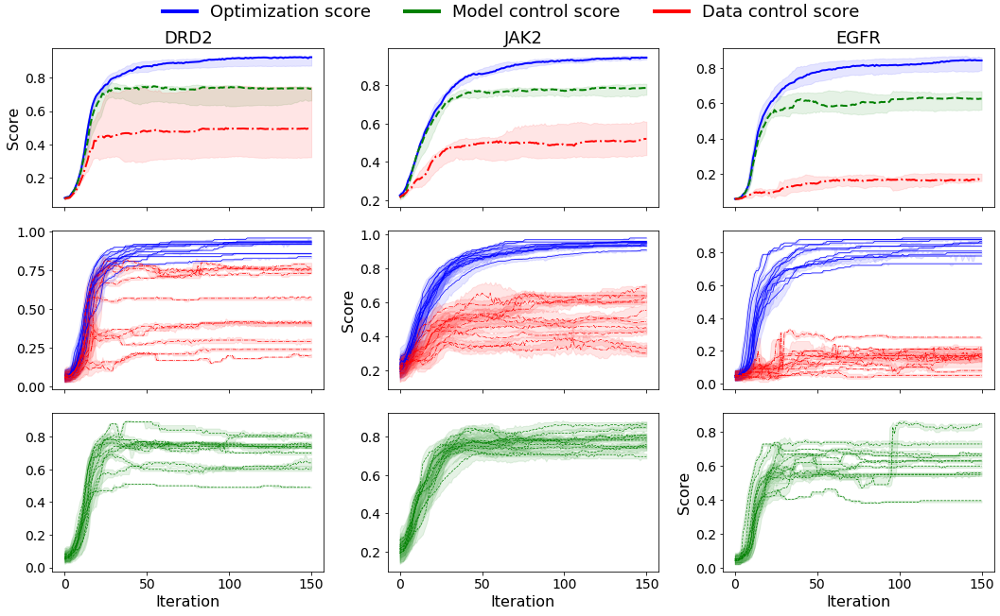

results/goal_directed_paper/graph_ga/CHEMBL1909140
results/goal_directed_paper/graph_ga/CHEMBL3888429
results/goal_directed_paper/graph_ga/CHEMBL1909203


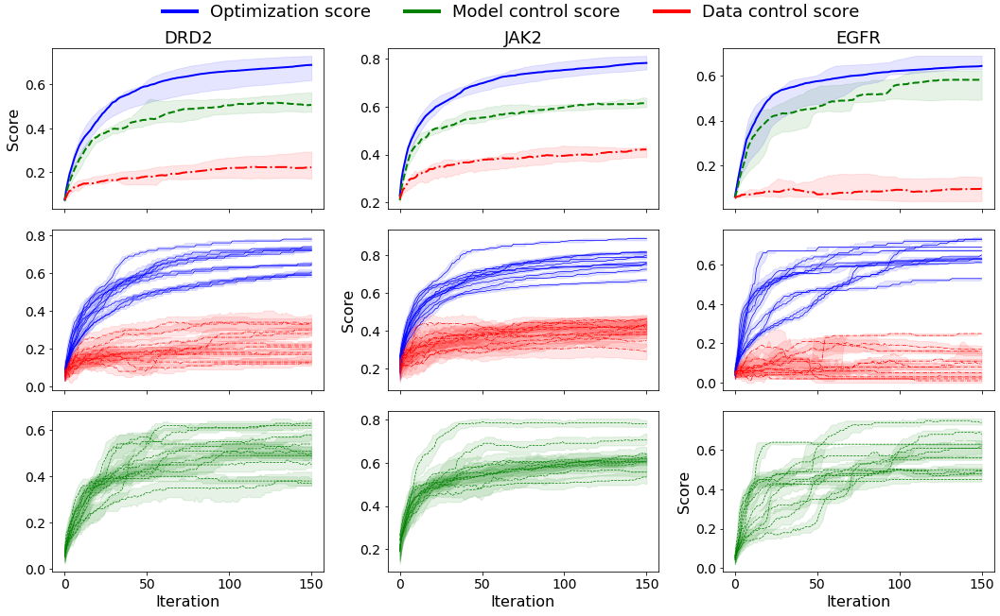

In [ ]:
nrows=3
ncols = len(chids)

for optimizer in optimizers:
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 9), sharex=True)

    # store aucs while looping
    aucs = {}
    for i, chid in enumerate(chids):
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        aucs[chid] = auc

        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound',
                     col_dict=col_dict, legend_dict=legend_dict, skip=[], ax=axes[0][i], legend=False, lw=2, ls_dict=ls_dict)
        plot_wrapper(preds_internal, median_score_single, name='median_score_single',
                     col_dict=col_dict, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[1][i], legend=False, lw=0.7, ls_dict=ls_dict)

        plot_wrapper(preds_internal, median_score_single, name='median_score_single',
                     col_dict=col_dict, legend_dict=legend_dict, skip=['Split1','Split2'], ax=axes[2][i], legend=False, lw=0.7,ls_dict=ls_dict)

    # set axis labels
    for i in range(ncols):
        axes[-1][i].set_xlabel('Iteration')

    for i in range(nrows):
        axes[i][i].set_ylabel('Score')

    #set legend and titles
    for i, chid in enumerate(chids):
        axes[0][i].set_title(chid2name[chid], fontsize=18)
    custom_lines = [Line2D([0], [0], color=color, lw=4) for color in col_dict.values()]
    fig.legend(custom_lines, list(legend_dict.values()), loc='upper center',
               ncol=3, bbox_to_anchor=(0.5, 1.025), frameon=False)
    fig.tight_layout()
    plt.show()

# Comparison of LSTM and GA

results/goal_directed_paper/lstm_hc/CHEMBL1909140
results/goal_directed_paper/lstm_hc/CHEMBL3888429
results/goal_directed_paper/lstm_hc/CHEMBL1909203
results/goal_directed_paper/graph_ga/CHEMBL1909140
results/goal_directed_paper/graph_ga/CHEMBL3888429
results/goal_directed_paper/graph_ga/CHEMBL1909203


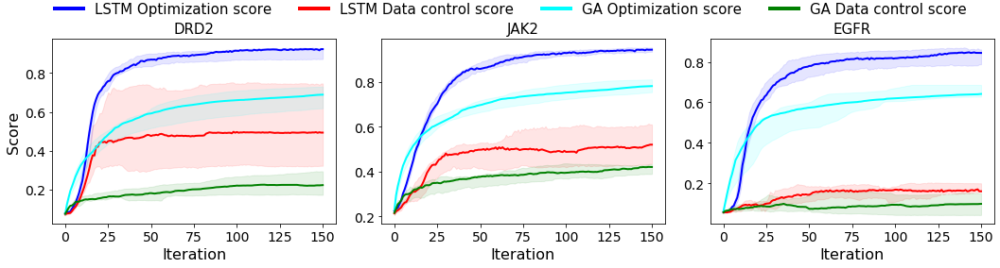

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(chids), figsize=(15, 4), sharex=True)

for ridx, (optimizer, cd) in enumerate(zip(['lstm_hc', 'graph_ga'], [col_dict, col_dict2])):
    for i, chid in enumerate(chids):
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', col_dict=cd, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[i], legend=False, lw=2, ls_dict=defaultdict(lambda: None))

axes[0].set_ylabel('Score')
for ax in axes:
    ax.set_xlabel('Iteration')
    
for i, chid in enumerate(chids):
    axes[i].set_title(chid2name[chid], fontsize=15)

def interleave(l1, l2):
    return [val for pair in zip(l1, l2) for val in pair]

lstm_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict.items() if k!='Split1_alt']
ga_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict2.items() if k!='Split1_alt']
lines = lstm_lines+ga_lines
# lines = interleave(lstm_lines, ga_lines)

lstm_names = [f'LSTM {v}' for k, v in legend_dict.items() if k!='Split1_alt']
ga_names = [f'GA {v}' for k, v in legend_dict.items() if k!='Split1_alt']
names = lstm_names + ga_names
# names = interleave(lstm_names, ga_names)

fig.legend(lines, names, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.025), frameon=False, fontsize=15)

fig.tight_layout()
if write:
    plt.savefig(f'{figure_dir}/ga_lstm_comparison.pdf')

# KDE animations

In [ ]:
# This may take a while
# Make kernel density plots over the iterations
import seaborn as sns
from multiprocessing import Pool

def make_kde_series(optimizer, chid):
    alpha=0.3
    n_ext = 1000
    
    # load predictions
    preds_internal, preds_external, auc,_ ,_ = load_chid(results_dir/optimizer/chid, order)
    pred1 = preds_internal['Split1']
    pred2 = preds_internal['Split2']
    pred1_ext = preds_external['Split1']
    pred2_ext = preds_external['Split2']

    # create directory
    kde_dir = Path(f'{figure_dir}/kde/{chid}_{optimizer}')
    os.makedirs(kde_dir, exist_ok=True)
    
    # check if all runs have same length
    run_lengths = [len(run) for run in pred1]
    assert all(l == run_lengths[0] for l in run_lengths)

    # make a plot for each iteration
    for it in range(len(pred1[0])):
        for run in range(len(pred1)):
            sns.kdeplot(pred1[run][it], pred2[run][it], shade=True,shade_lowest=False, alpha=0.2)
        sns.kdeplot(pred1_ext[run][:n_ext], pred2_ext[run][:n_ext], shade=True,shade_lowest=False, alpha=0.5, cmap='Greys')
        
        # h/v lines at 0.5
        plt.axvline(0.5, c='black', alpha=alpha)
        plt.axhline(0.5, c='black',alpha=alpha)
        
        # limits and diagonal
        plt.xlim((-0.013,1.013))
        plt.ylim((-0.013,1.013))
        plt.plot((-0.013,1.013), (-0.013,1.013), c='black', alpha=0.4)
        
        # axes labels
        plt.xlabel('Optimizer score')
        plt.ylabel('Control score')
        
        if write:
            plt.savefig(kde_dir/f'{it:03}')
        plt.clf()

optimizers = ['graph_ga', 'lstm_hc']

from itertools import product
with Pool(6) as pool:
    pool.starmap(make_kde_series, product(optimizers, chids))

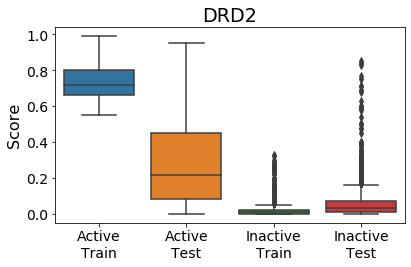

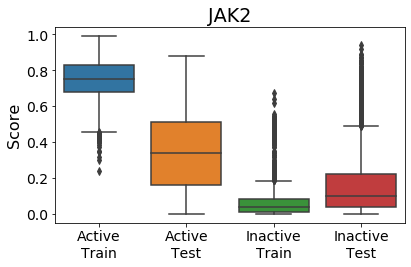

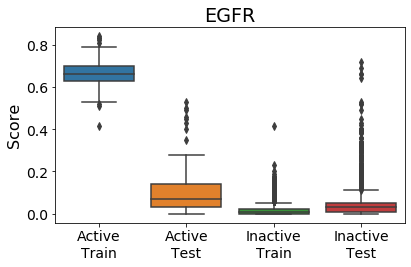

In [ ]:
import scipy.stats as st
import seaborn as sns
import pickle 

with open(results_dir/'predictions.p', 'rb') as f:
    trainset_predictions = pickle.load(f)

for chid in trainset_predictions.keys():
    p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]


    df_train =  pd.DataFrame({'Score': p11s,
     'Label': ['Active' if l else 'Inactive' for l in y1s],
     'Split': ['Train'] * y1s.shape[0]})
    df_test =  pd.DataFrame({'Score': p12s,
     'Label': ['Active' if l else 'Inactive' for l in y2s],
     'Split': ['Test'] * y2s.shape[0]})

    df = pd.concat([df_train,df_test])
    df['group'] = ['\n'.join([y,x]) for x, y in zip(df.Split, df.Label)]
    df =  df.sort_values('group')
    g = sorted(list(set(df.group)))
    class_order = [g[1], g[0], g[3], g[2]]
    sns.boxplot(x='group', y='Score', data=df, order=class_order)
    plt.title(chid2name.get(chid, chid))
    plt.xlabel(None)
    plt.tight_layout()
    if write:
        plt.savefig(f'{figure_dir}/data_biases_boxplot_{chid2name.get(chid, chid)}.pdf')
        
    plt.show()

## Calculate correlation between the scores

In [ ]:
from scipy.stats import spearmanr, pearsonr

acc_ext = []
acc_int = []
for chid in chids:
    for optimizer in ['graph_ga', 'lstm_hc']:
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, auc, _, _ = load_chid(chid_dir, order)
        
        os = np.concatenate(preds_external['Split1'])
        mcs = np.concatenate(preds_external['Split1_alt'])
        dcs = np.concatenate(preds_external['Split2'])
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_ext.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        os = np.concatenate([s[-1] for s in preds_internal['Split1']])
        mcs = np.concatenate([s[-1] for s in preds_internal['Split1_alt']])
        dcs = np.concatenate([s[-1] for s in preds_internal['Split2']])
#         print(os)
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_int.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        
cols = ['Task', 'Optimizer', 'SpearmanR OS-MCS', 'PearsonR OS-MCS', 'SpearmanR OS-DCS', 'PearsonR OS-DCS']
df_ext = pd.DataFrame(acc_ext)
df_ext.columns = cols
print(df_ext.to_markdown()+'\n')

df_int = pd.DataFrame(acc_int)
df_int.columns = cols
print(df_int.to_markdown())

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR OS-DCS |
|---:|:-------|:------------|-------------------:|------------------:|-------------------:|------------------:|
|  0 | DRD2   | graph_ga    |           0.746666 |          0.796201 |           0.399379 |          0.426517 |
|  1 | DRD2   | lstm_hc     |           0.747676 |          0.797169 |           0.394619 |          0.412861 |
|  2 | JAK2   | graph_ga    |           0.752263 |          0.766563 |           0.362045 |          0.36982  |
|  3 | JAK2   | lstm_hc     |           0.754302 |          0.769395 |           0.368276 |          0.374611 |
|  4 | EGFR   | graph_ga    |           0.698443 |          0.758298 |           0.226968 |          0.216318 |
|  5 | EGFR   | lstm_hc     |           0.691547 |          0.757749 |           0.237924 |          0.231584 |

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR 